# Data Driven vehicle price projection for smart investment

# Introduction
In the rapidly evolving landscape of the automotive industry, our data science project, Vehicle Price Prediction, takes center stage, aiming to revolutionize how we perceive and navigate the complexities of pricing vehicles. Fueled by the wealth of available data and advanced machine learning techniques, our project seeks to provide a reliable and accurate tool for forecasting vehicle prices. By analyzing historical and real-time data, we aim to uncover hidden patterns and trends that influence pricing dynamics, offering valuable insights to buyers, sellers, and industry stakeholders. Our goal is to transcend traditional pricing methods and create a dynamic predictive model that adapts to market fluctuations, empowering users to make well-informed decisions when buying, selling, or investing in vehicles.

# Datasets
The dataset utilized in this research is sourced from Kaggle: https://www.kaggle.com/datasets/nehalbirla/vehicle-dataset-from-cardekho. <br>This comprehensive dataset includes information on model cars, year of manufacture, selling price, kilometers driven, fuel type, seller type, transmission, engine specifications, maximum power, and other relevant attributes.

## Import Library

In [1]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)
import warnings

warnings.filterwarnings("ignore")

## Import Data

In [2]:

data = pd.read_csv('./car details v4.csv')
data

,Make,Model,Price,Year,Kilometer,Fuel Type,Transmission,Location,Color,Owner,Seller Type,Engine,Max Power,Max Torque,Drivetrain,Length,Width,Height,Seating Capacity,Fuel Tank Capacity
0,Honda,Amaze 1.2 VX i-VTEC,505000,2017,87150,Petrol,Manual,Pune,Grey,First,Corporate,1198 cc,87 bhp @ 6000 rpm,109 Nm @ 4500 rpm,FWD,3990.0,1680.0,1505.0,5.0,35.0
1,Maruti Suzuki,Swift DZire VDI,450000,2014,75000,Diesel,Manual,Ludhiana,White,Second,Individual,1248 cc,74 bhp @ 4000 rpm,190 Nm @ 2000 rpm,FWD,3995.0,1695.0,1555.0,5.0,42.0
2,Hyundai,i10 Magna 1.2 Kappa2,220000,2011,67000,Petrol,Manual,Lucknow,Maroon,First,Individual,1197 cc,79 bhp @ 6000 rpm,112.7619 Nm @ 4000 rpm,FWD,3585.0,1595.0,1550.0,5.0,35.0
3,Toyota,Glanza G,799000,2019,37500,Petrol,Manual,Mangalore,Red,First,Individual,1197 cc,82 bhp @ 6000 rpm,113 Nm @ 4200 rpm,FWD,3995.0,1745.0,1510.0,5.0,37.0
4,Toyota,Innova 2.4 VX 7 STR [2016-2020],1950000,2018,69000,Diesel,Manual,Mumbai,Grey,First,Individual,2393 cc,148 bhp @ 3400 rpm,343 Nm @ 1400 rpm,RWD,4735.0,1830.0,1795.0,7.0,55.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2054,Mahindra,XUV500 W8 [2015-2017],850000,2016,90300,Diesel,Manual,Surat,White,First,Individual,2179 cc,138 bhp @ 3750 rpm,330 Nm @ 1600 rpm,FWD,4585.0,1890.0,1785.0,7.0,70.0
2055,Hyundai,Eon D-Lite +,275000,2014,83000,Petrol,Manual,Ahmedabad,White,Second,Individual,814 cc,55 bhp @ 5500 rpm,75 Nm @ 4000 rpm,FWD,3495.0,1550.0,1500.0,5.0,32.0
2056,Ford,Figo Duratec Petrol ZXI 1.2,240000,2013,73000,Petrol,Manual,Thane,Silver,First,Individual,1196 cc,70 bhp @ 6250 rpm,102 Nm @ 4000 rpm,FWD,3795.0,1680.0,1427.0,5.0,45.0
2057,BMW,5-Series 520d Luxury Line [2017-2019],4290000,2018,60474,Diesel,Automatic,Coimbatore,White,First,Individual,1995 cc,188 bhp @ 4000 rpm,400 Nm @ 1750 rpm,RWD,4936.0,1868.0,1479.0,5.0,65.0


## Exploratory Data Analaysis


In [7]:
import ydata_profiling
from pandas_profiling import ProfileReport

In [8]:
report = ProfileReport
report(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [3]:

data[['Engine-split-0-mjn6', 'Engine-split-1-mjn6']] = data['Engine'].str.split(' ', n=-1, expand=True, regex=None)
data = data[data.columns[:12].tolist() + ['Engine-split-0-mjn6', 'Engine-split-1-mjn6'] + data.columns[12:-2].tolist()]

data.drop(['Engine', 'Engine-split-1-mjn6'], axis=1, inplace=True)
data.rename(columns={'Engine-split-0-mjn6': 'Engine'}, inplace=True)

data[['Max Power-split-0-3zjl', 'Max Power-split-1-3zjl']] = data['Max Power'].str.split('@', n=-1, expand=True, regex=None)
data = data[data.columns[:12].tolist() + ['Max Power-split-0-3zjl', 'Max Power-split-1-3zjl'] + data.columns[12:-2].tolist()]

data.drop(['Max Power'], axis=1, inplace=True)

data[['Max Power-split-0-3zjl-split-0-66pe', 'Max Power-split-0-3zjl-split-1-66pe', 'Max Power-split-0-3zjl-split-2-66pe']] = data['Max Power-split-0-3zjl'].str.split(' ', n=-1, expand=True, regex=None)
data = data[data.columns[:20].tolist() + ['Max Power-split-0-3zjl-split-0-66pe', 'Max Power-split-0-3zjl-split-1-66pe', 'Max Power-split-0-3zjl-split-2-66pe'] + data.columns[20:-3].tolist()]

data.drop(['Max Power-split-0-3zjl'], axis=1, inplace=True)
data.rename(columns={'Max Power-split-0-3zjl-split-0-66pe': 'Max Power Bph'}, inplace=True)
data.drop(['Max Power-split-0-3zjl-split-1-66pe', 'Max Power-split-0-3zjl-split-2-66pe'], axis=1, inplace=True)

data[['Max Power-split-1-3zjl-split-0-6uaa', 'Max Power-split-1-3zjl-split-1-6uaa']] = data['Max Power-split-1-3zjl'].str.split('rpm', n=-1, expand=True, regex=None)
data = data[data.columns[:20].tolist() + ['Max Power-split-1-3zjl-split-0-6uaa', 'Max Power-split-1-3zjl-split-1-6uaa'] + data.columns[20:-2].tolist()]
data.drop(['Max Power-split-1-3zjl'], axis=1, inplace=True)

data.rename(columns={'Max Power-split-1-3zjl-split-0-6uaa': 'Max Power rpm'}, inplace=True)
data.drop(['Max Power-split-1-3zjl-split-1-6uaa'], axis=1, inplace=True)

data[['Max Torque-split-0-6wn8', 'Max Torque-split-1-6wn8']] = data['Max Torque'].str.split('@', n=-1, expand=True, regex=None)
data = data[data.columns[:12].tolist() + ['Max Torque-split-0-6wn8', 'Max Torque-split-1-6wn8'] + data.columns[12:-2].tolist()]

data[['Max Torque-split-0-6wn8-split-0-0z3t', 'Max Torque-split-0-6wn8-split-1-0z3t']] = data['Max Torque-split-0-6wn8'].str.split('Nm', n=-1, expand=True, regex=None)
data = data[data.columns[:22].tolist() + ['Max Torque-split-0-6wn8-split-0-0z3t', 'Max Torque-split-0-6wn8-split-1-0z3t'] + data.columns[22:-2].tolist()]

data.drop(['Max Torque', 'Max Torque-split-0-6wn8', 'Max Torque-split-0-6wn8-split-1-0z3t'], axis=1, inplace=True)

data[['Max Torque-split-1-6wn8-split-0-gblt', 'Max Torque-split-1-6wn8-split-1-gblt']] = data['Max Torque-split-1-6wn8'].str.split('rpm', n=-1, expand=True, regex=None)
data = data[data.columns[:21].tolist() + ['Max Torque-split-1-6wn8-split-0-gblt', 'Max Torque-split-1-6wn8-split-1-gblt'] + data.columns[21:-2].tolist()]

data.rename(columns={'Max Torque-split-0-6wn8-split-0-0z3t': 'Max Torque Nm'}, inplace=True)
data.drop(['Max Torque-split-1-6wn8'], axis=1, inplace=True)

data.rename(columns={'Max Torque-split-1-6wn8-split-0-gblt': 'Max Torque rpm'}, inplace=True)
data.drop(['Max Torque-split-1-6wn8-split-1-gblt'], axis=1, inplace=True)

In [4]:
data.head()

,Make,Model,Price,Year,Kilometer,Fuel Type,Transmission,Location,Color,Owner,...,Drivetrain,Length,Width,Height,Seating Capacity,Max Power Bph,Max Power rpm,Max Torque Nm,Max Torque rpm,Fuel Tank Capacity
0,Honda,Amaze 1.2 VX i-VTEC,505000,2017,87150,Petrol,Manual,Pune,Grey,First,...,FWD,3990.0,1680.0,1505.0,5.0,87,6000,109,4500,35.0
1,Maruti Suzuki,Swift DZire VDI,450000,2014,75000,Diesel,Manual,Ludhiana,White,Second,...,FWD,3995.0,1695.0,1555.0,5.0,74,4000,190,2000,42.0
2,Hyundai,i10 Magna 1.2 Kappa2,220000,2011,67000,Petrol,Manual,Lucknow,Maroon,First,...,FWD,3585.0,1595.0,1550.0,5.0,79,6000,112.7619,4000,35.0
3,Toyota,Glanza G,799000,2019,37500,Petrol,Manual,Mangalore,Red,First,...,FWD,3995.0,1745.0,1510.0,5.0,82,6000,113,4200,37.0
4,Toyota,Innova 2.4 VX 7 STR [2016-2020],1950000,2018,69000,Diesel,Manual,Mumbai,Grey,First,...,RWD,4735.0,1830.0,1795.0,7.0,148,3400,343,1400,55.0


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2059 entries, 0 to 2058
Data columns (total 22 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Make                2059 non-null   object 
 1   Model               2059 non-null   object 
 2   Price               2059 non-null   int64  
 3   Year                2059 non-null   int64  
 4   Kilometer           2059 non-null   int64  
 5   Fuel Type           2059 non-null   object 
 6   Transmission        2059 non-null   object 
 7   Location            2059 non-null   object 
 8   Color               2059 non-null   object 
 9   Owner               2059 non-null   object 
 10  Seller Type         2059 non-null   object 
 11  Engine              1979 non-null   object 
 12  Drivetrain          1923 non-null   object 
 13  Length              1995 non-null   float64
 14  Width               1995 non-null   float64
 15  Height              1995 non-null   float64
 16  Seatin

In [9]:
data['Max Torque rpm'].unique()

array([' 4500 ', ' 2000 ', ' 4000 ', ' 4200 ', ' 1400 ', ' 1200 ',
       ' 1750 ', ' 1250 ', ' 1900 ', ' 4250 ', ' 4400 ', ' 1500 ',
       ' 3500 ', ' 4850 ', ' 3800 ', ' 4800 ', nan, ' 3000 ', ' 1800 ',
       ' 1600 ', '3000', ' 1350 ', ' 4600 ', ' 4300 ', ' 3750 ', ' 4100 ',
       '1600', ' 2800 ', ' 2250 ', ' 1340 ', ' 1300 ', '4600', '1700',
       '3600', '3500', '2000', '1400', ' 5000 ', ' 4386 ', ' 3300 ',
       ' 2750 ', ' 1700 ', '4000', ' 5600 ', ' 2500 ', ' 1450 ', ' 4700 ',
       '4500', '1500', ' 2200 ', '5000', '4750', ' 1950 ', ' 6500 ',
       '1800', ' 1850 ', ' 1650 ', ' 1370 ', ' 150 ', '2600', ' 2150 ',
       ' 2400 ', '2400', '1750', '4200', ' 3250 ', ' 1360 ', ' 3600 ',
       '2800', ' 3100 ', ' 1620 ', '3400', '2700'], dtype=object)

In [10]:
data['Engine'] = data['Engine'].fillna(0).astype('int')
data['Max Torque Nm'] = data['Max Torque Nm'].fillna(0).astype('float')
data['Max Torque rpm'] = data['Max Torque rpm'].fillna(0).astype('int')
data['Max Power Bph'] = data['Max Power Bph'].fillna(0).astype('float')


In [11]:

data['Max Power rpm'] = data['Max Power rpm'].replace('',0)
data['Max Power rpm'] = data['Max Power rpm'].fillna(0).astype('int')

In [12]:
data.head()

,Make,Model,Price,Year,Kilometer,Fuel Type,Transmission,Location,Color,Owner,...,Drivetrain,Length,Width,Height,Seating Capacity,Max Power Bph,Max Power rpm,Max Torque Nm,Max Torque rpm,Fuel Tank Capacity
0,Honda,Amaze 1.2 VX i-VTEC,505000,2017,87150,Petrol,Manual,Pune,Grey,First,...,FWD,3990.0,1680.0,1505.0,5.0,87.0,6000,109.0000,4500,35.0
1,Maruti Suzuki,Swift DZire VDI,450000,2014,75000,Diesel,Manual,Ludhiana,White,Second,...,FWD,3995.0,1695.0,1555.0,5.0,74.0,4000,190.0000,2000,42.0
2,Hyundai,i10 Magna 1.2 Kappa2,220000,2011,67000,Petrol,Manual,Lucknow,Maroon,First,...,FWD,3585.0,1595.0,1550.0,5.0,79.0,6000,112.7619,4000,35.0
3,Toyota,Glanza G,799000,2019,37500,Petrol,Manual,Mangalore,Red,First,...,FWD,3995.0,1745.0,1510.0,5.0,82.0,6000,113.0000,4200,37.0
4,Toyota,Innova 2.4 VX 7 STR [2016-2020],1950000,2018,69000,Diesel,Manual,Mumbai,Grey,First,...,RWD,4735.0,1830.0,1795.0,7.0,148.0,3400,343.0000,1400,55.0


In [10]:
#data.to_csv('Car Detail v5.csv', index=False)

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2059 entries, 0 to 2058
Data columns (total 22 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Make                2059 non-null   object 
 1   Model               2059 non-null   object 
 2   Price               2059 non-null   int64  
 3   Year                2059 non-null   int64  
 4   Kilometer           2059 non-null   int64  
 5   Fuel Type           2059 non-null   object 
 6   Transmission        2059 non-null   object 
 7   Location            2059 non-null   object 
 8   Color               2059 non-null   object 
 9   Owner               2059 non-null   object 
 10  Seller Type         2059 non-null   object 
 11  Engine              2059 non-null   int64  
 12  Drivetrain          1923 non-null   object 
 13  Length              1995 non-null   float64
 14  Width               1995 non-null   float64
 15  Height              1995 non-null   float64
 16  Seatin

count    2.059000e+03
mean     1.702992e+06
std      2.419881e+06
min      4.900000e+04
25%      4.849990e+05
50%      8.250000e+05
75%      1.925000e+06
max      3.500000e+07
Name: Price, dtype: float64

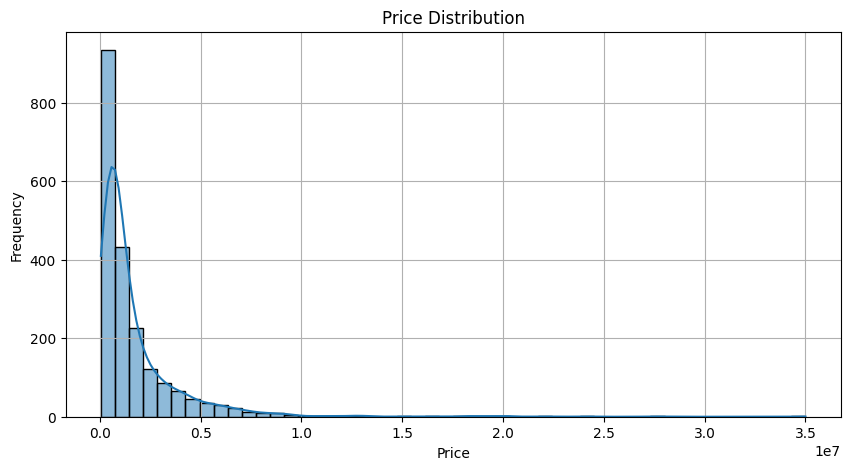

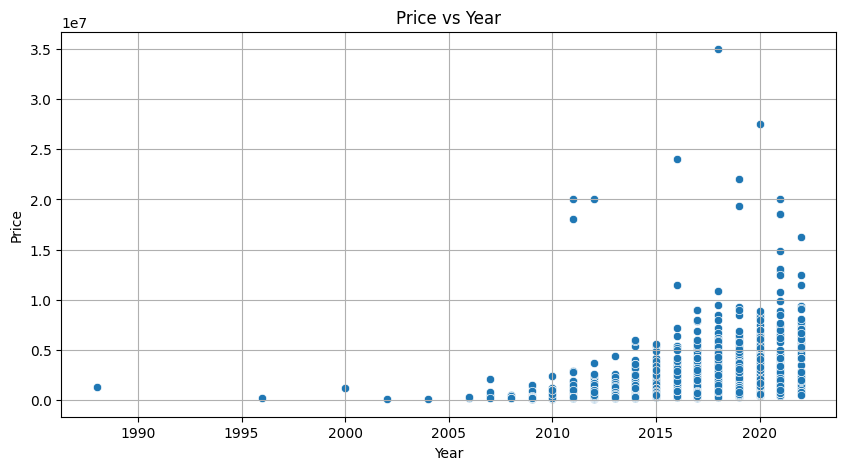

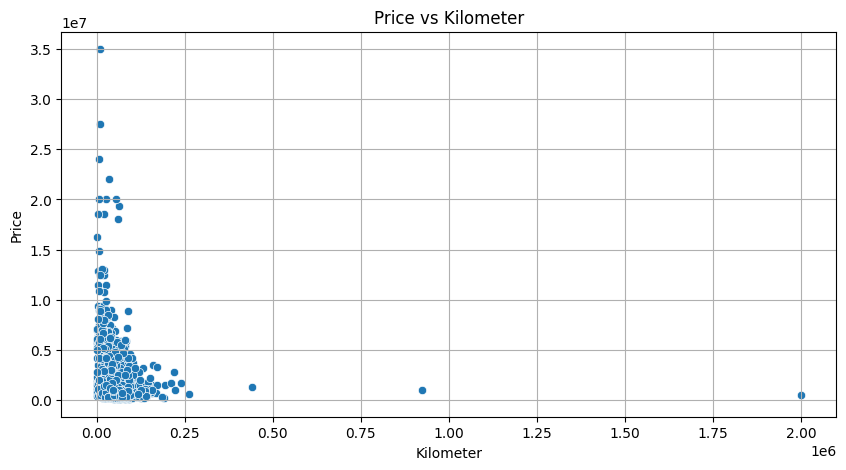

In [12]:
description_price = data['Price'].describe()

# Plotting the Price distribution
plt.figure(figsize=(10, 5))
sns.histplot(data['Price'], bins=50, kde=True)
plt.title('Price Distribution')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.grid(True)
plt.savefig('price_distribution.png')

# Checking the relationship between Price and Year
plt.figure(figsize=(10, 5))
sns.scatterplot(x='Year', y='Price', data=data)
plt.title('Price vs Year')
plt.xlabel('Year')
plt.ylabel('Price')
plt.grid(True)
plt.savefig('price_year_relationship.png')

# Checking the relationship between Price and Kilometer
plt.figure(figsize=(10, 5))
sns.scatterplot(x='Kilometer', y='Price', data=data)
plt.title('Price vs Kilometer')
plt.xlabel('Kilometer')
plt.ylabel('Price')
plt.grid(True)
plt.savefig('price_kilometer_relationship.png')

description_price

From the Price vs Year scatter plot, we can observe that newer cars tend to be priced higher, which is expected as cars depreciate over time. The Price vs Kilometer scatter plot shows that cars with lower kilometers tend to have higher prices, which also aligns with the general expectation that cars with less wear and tear (as indicated by fewer kilometers) are valued more.

Given the skewness of the price distribution, a median price would be a more representative measure of central tendency for the typical car price than the mean. Dealers and individual sellers could use this information to price their cars competitively. For buyers, it suggests that there are deals to be found below the median price, especially if they are willing to consider older models or cars with higher mileage. For sellers, it may be beneficial to highlight the low mileage or recent model year of a car to justify a higher price point.

In [13]:
data_numeric = data.select_dtypes(include = 'number')
data_numeric

,Price,Year,Kilometer,Engine,Length,Width,Height,Seating Capacity,Max Power Bph,Max Power rpm,Max Torque Nm,Max Torque rpm,Fuel Tank Capacity
0,505000,2017,87150,1198,3990.0,1680.0,1505.0,5.0,87.0,6000,109.0000,4500,35.0
1,450000,2014,75000,1248,3995.0,1695.0,1555.0,5.0,74.0,4000,190.0000,2000,42.0
2,220000,2011,67000,1197,3585.0,1595.0,1550.0,5.0,79.0,6000,112.7619,4000,35.0
3,799000,2019,37500,1197,3995.0,1745.0,1510.0,5.0,82.0,6000,113.0000,4200,37.0
4,1950000,2018,69000,2393,4735.0,1830.0,1795.0,7.0,148.0,3400,343.0000,1400,55.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2054,850000,2016,90300,2179,4585.0,1890.0,1785.0,7.0,138.0,3750,330.0000,1600,70.0
2055,275000,2014,83000,814,3495.0,1550.0,1500.0,5.0,55.0,5500,75.0000,4000,32.0
2056,240000,2013,73000,1196,3795.0,1680.0,1427.0,5.0,70.0,6250,102.0000,4000,45.0
2057,4290000,2018,60474,1995,4936.0,1868.0,1479.0,5.0,188.0,4000,400.0000,1750,65.0


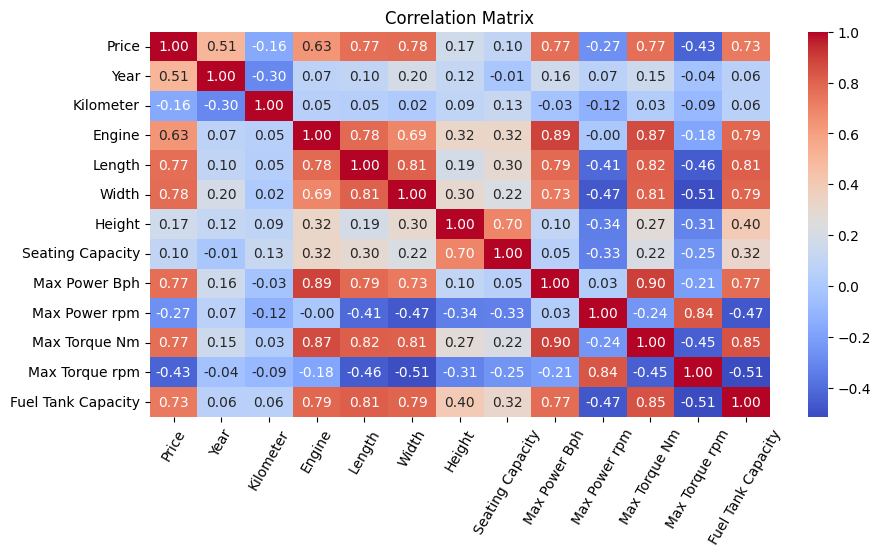

Correlation of Price with other variables:
Price                 1.000000
Width                 0.775199
Max Torque Nm         0.769110
Max Power Bph         0.766703
Length                0.765547
Fuel Tank Capacity    0.732512
Engine                0.634358
Year                  0.507400
Height                0.170260
Seating Capacity      0.096884
Kilometer            -0.159751
Max Power rpm        -0.266983
Max Torque rpm       -0.430971
Name: Price, dtype: float64


In [42]:
correlation_matrix = data_numeric.corr()

# Plotting the correlation matrix
plt.figure(figsize=(10, 5))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.xticks(rotation=60)
plt.title('Correlation Matrix')
plt.show()

# Print the correlation of 'Price' with other variables
print('Correlation of Price with other variables:')
print(correlation_matrix['Price'].sort_values(ascending=False))

Insight :
* Width, Max Torque Nm, Max Power Bph, Length, and Fuel Tank Capacity have strong positive correlations with Price. This suggests that as these features increase, the Price of the vehicle tends to increase as well.
* Engine and Year have moderate positive correlations with Price. This indicates that vehicles with larger engines and newer models tend to have higher prices.
* Height and Seating Capacity have weak positive correlations with Price. While these correlations are not very strong, they still suggest a slight positive relationship.
* Kilometer, Max Power rpm, and Max Torque rpm have weak negative correlations with Price. This indicates that as these features increase, the Price tends to decrease.


Suggestion: 
* The company may consider marketing and emphasizing these features in higher-priced models, as they seem to positively influence the overall price.
* Focus on developing and promoting models with powerful engines, and keep the product lineup fresh with newer models to potentially command higher prices.
* While these features may not be the primary drivers of price, they can still be used as additional selling points. Consider marketing these aspects to specific target audiences who value them.
* Be cautious about setting higher prices for vehicles with higher kilometers, lower maximum power rpm, and lower maximum torque rpm. Consider adjusting pricing strategies based on these factors.


The strongest positive correlations are with physical dimensions (Width, Length) and performance indicators (Max Torque Nm, Max Power Bph), suggesting that customers are willing to pay more for larger and more powerful vehicles.

The negative correlations with Kilometer and engine RPMs suggest that factors associated with usage and lower performance may lead to lower prices.

In [15]:
from scipy.stats import pointbiserialr
from tqdm.auto import tqdm

tqdm.pandas()

def calculate_pbs_correlation(data, cat_var, cont_var):
    # Convert categorical variable to numeric codes
    categories = data[cat_var].astype('category').cat.codes
    # Calculate point-biserial correlation
    correlation, p_value = pointbiserialr(categories, data[cont_var])
    return correlation, p_value

# List of categorical variables
categorical_vars = ['Make', 'Model', 'Fuel Type', 'Transmission', 'Location', 'Color', 'Owner', 'Seller Type', 'Drivetrain']

# Calculate point-biserial correlation for each categorical variable with 'Price'
correlations = {}
for cat_var in tqdm(categorical_vars):
    correlations[cat_var] = calculate_pbs_correlation(data, cat_var, 'Price')

# Display the correlations
for cat_var, (correlation, p_value) in correlations.items():
    print(f'{cat_var}: correlation={correlation:.4f}, p-value={p_value:.4g}')

  0%|          | 0/9 [00:00<?, ?it/s]

Make: correlation=-0.0382, p-value=0.08314
Model: correlation=-0.0786, p-value=0.0003578
Fuel Type: correlation=-0.1282, p-value=5.353e-09
Transmission: correlation=-0.4768, p-value=2.187e-117
Location: correlation=-0.1154, p-value=1.53e-07
Color: correlation=-0.1289, p-value=4.371e-09
Owner: correlation=0.0294, p-value=0.1829
Seller Type: correlation=-0.0704, p-value=0.001402
Drivetrain: correlation=-0.0087, p-value=0.6919


The categorical variable 'Transmission' exhibits a markedly robust negative correlation with the 'Price' of cars, implying that vehicles equipped with specific types of transmissions may be priced lower than their counterparts. Similarly, 'Fuel Type' and 'Color' display negative correlations, suggesting that these attributes wield discernible influences on car pricing. 'Model' and 'Location' demonstrate comparatively weaker but still noteworthy negative correlations with price. Conversely, 'Make,' 'Seller Type,' and 'Owner' exhibit exceedingly weak correlations, suggesting a marginal impact on pricing dynamics. Furthermore, 'Drivetrain' displays an almost negligible correlation with price, indicative of its minimal influence on overall pricing.

In light of the correlation analysis between categorical variables and car prices, several strategic recommendations emerge for companies operating in the automotive industry:

1. **Transmission Focus**<br>
Considering the strong negative correlation between transmission type and price, the company may contemplate expanding its offering of automatic transmission options, particularly as they are typically favored in higher-priced vehicles.

2. **Fuel Type Strategy** <br>
Given the negative correlation between fuel type and price, exploring the market potential for hybrid or electric vehicles could be advantageous. These vehicles, often priced higher, align with the increasing consumer interest in environmentally friendly options.

3. **Color Variants** <br>
Recognizing the impact of color on pricing, the company could conduct a detailed analysis to identify which colors are associated with higher-priced models. Adjusting the color offerings accordingly may prove beneficial in aligning with consumer preferences.

4. **Model and Location Adaptation** <br>
The negative correlation of model and location with price suggests that certain models enjoy greater popularity in specific locations. Tailoring the product lineup to regional preferences could enhance market acceptance and appeal.

5. **Seller Type and Marketing**<br>
Given the weak correlation with seller type, the company might consider strengthening its dealership networks or exploring alternative sales channels to cater to higher-end markets and enhance overall market penetration.

6. **Owner History** 
Although the correlation with the number of owners is minimal, the company might explore the implementation of certified pre-owned programs. Such initiatives, ensuring vehicle quality, can potentially command higher prices in the market.

{'Make': Make
 Maruti Suzuki    440
 Hyundai          349
 Mercedes-Benz    171
 Honda            158
 Toyota           132
 Audi             127
 BMW              121
 Mahindra         119
 Tata              57
 Volkswagen        50
 Name: count, dtype: int64,
 'Model': Model
 X1 sDrive20d xLine                       15
 Swift DZire VDI                          14
 City V                                   13
 Fortuner 2.8 4x2 AT [2016-2020]          13
 Swift DZire VXI                          12
 Swift VXi [2014-2017]                    12
 Swift VXi                                12
 5-Series 520d Luxury Line [2017-2019]    10
 A6 35 TDI Matrix                         10
 Verna Fluidic 1.6 CRDi SX                10
 Name: count, dtype: int64,
 'Fuel Type': Fuel Type
 Diesel          1049
 Petrol           942
 CNG               50
 Electric           7
 LPG                5
 Hybrid             3
 CNG + CNG          1
 Petrol + CNG       1
 Petrol + LPG       1
 Name: count, dtype: i

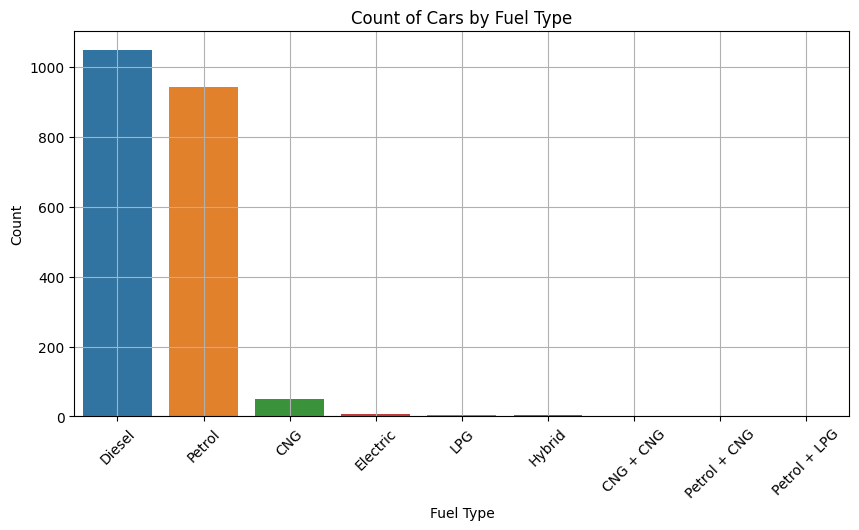

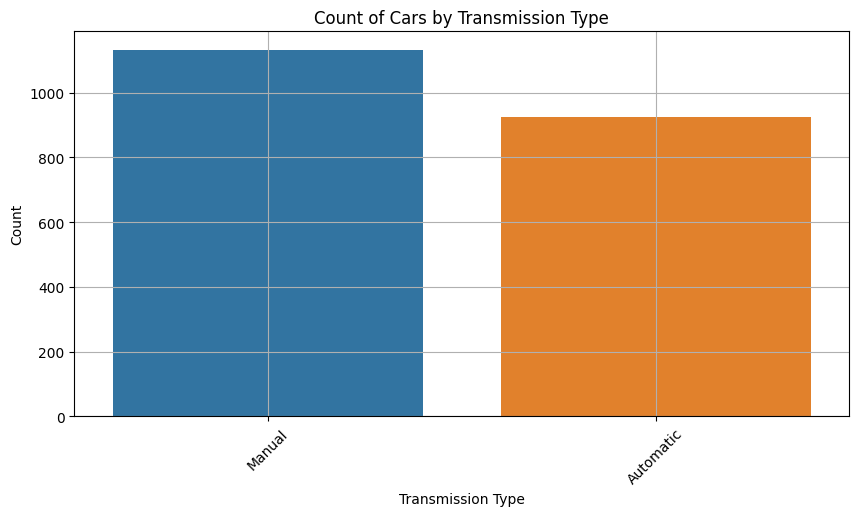

In [16]:
# Creating a dictionary to store the value counts for each categorical column
categorical_insights = {}

# Looping through each categorical column to get the value counts
for column in categorical_vars:
    categorical_insights[column] = data[column].value_counts().head(10)

# Plotting the count of each category for the 'Fuel Type' column
plt.figure(figsize=(10, 5))
sns.countplot(x='Fuel Type', data=data, order=data['Fuel Type'].value_counts().index)
plt.title('Count of Cars by Fuel Type')
plt.xlabel('Fuel Type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(True)
plt.savefig('count_by_fuel_type.png')
#plt.close()

# Plotting the count of each category for the 'Transmission' column
plt.figure(figsize=(10, 5))
sns.countplot(x='Transmission', data=data, order=data['Transmission'].value_counts().index)
plt.title('Count of Cars by Transmission Type')
plt.xlabel('Transmission Type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(True)
plt.savefig('count_by_transmission_type.png')
#plt.close()

categorical_insights

The categorical insights derived from the dataset provide valuable information about market preferences and trends within the used car segment. These insights can serve as a foundation for informed decision-making for both buyers and sellers in this market. Drawing upon these observations, the following suggestions are proposed for a company operating in the used car industry:

1. **Stock Diversity**<br>
   Ensure a well-balanced inventory by incorporating a mix of Diesel and Petrol vehicles, recognizing their prevalence as the most common fuel types. Additionally, consider including a selection of Electric and Hybrid vehicles to address the emerging market interest in alternative fuel options.

2. **Transmission Options**<br>
   Maintain a diverse range of inventory that encompasses both Manual and Automatic transmission cars. The relatively close numbers between manual and automatic transmissions suggest a balanced market preference, necessitating options to cater to varied buyer choices.

3. **Target Audience**<br>
   Focus marketing initiatives on first-time car buyers, given that the majority of listed cars are indicated as first-hand ownership. This trend implies a potential market pattern where individuals purchase new cars and subsequently enter the used car market, making this demographic a significant target for promotional efforts.

4. **Sales Channel**<br>
   Prioritize strategies to support individual sellers, as they overwhelmingly dominate the seller type in the dataset. Offering services such as comprehensive vehicle history reports, professional inspection services, and user-friendly online listing platforms can enhance the selling experience for private sellers and attract a broader customer base.

5. **Regional Preferences**<br>
   Analyze the 'Location' data to discern regional preferences and tailor inventory and marketing strategies accordingly. This regional understanding can guide decisions related to stocking specific models, adjusting pricing strategies, and optimizing promotional activities to align with local demand.

6. **Color Choices**<br>
   Take into consideration the 'Color' data to curate a vehicle inventory that reflects preferred colors within the market. Recognizing the influence of color on buyer decisions, aligning available options with popular color choices can enhance the attractiveness of the inventory.


## Data Preprocessing

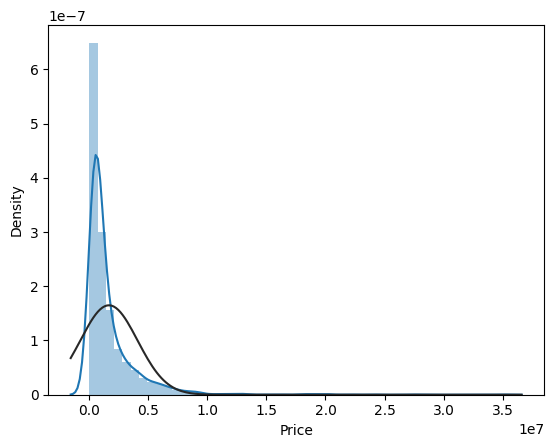

In [17]:
from scipy.stats import norm

sns.distplot(data['Price'], kde=True, fit = norm);
plt.show()

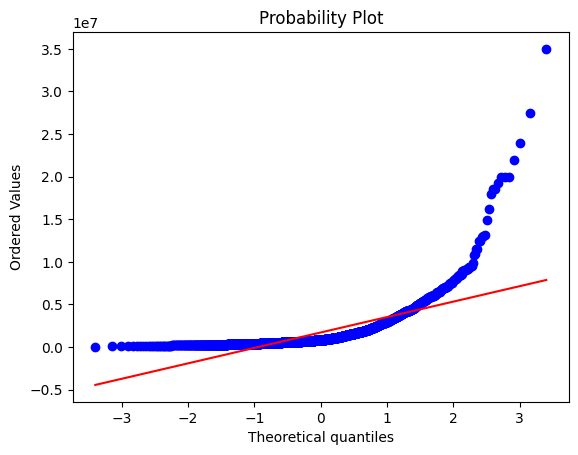

In [18]:
from scipy import stats

fig = plt.figure()
res = stats.probplot(data['Price'], plot=plt)
plt.show()


 mu = 13.81 and sigma = 0.98



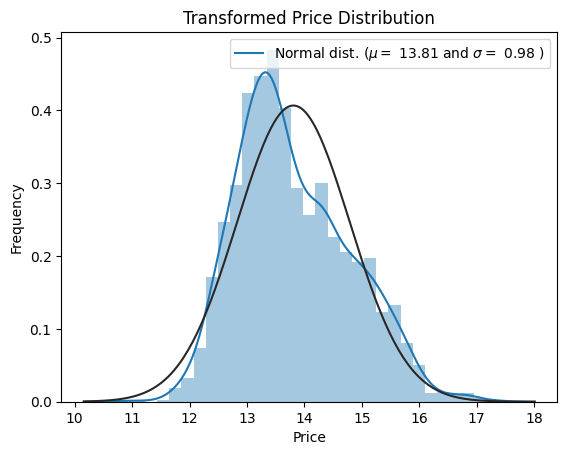

In [19]:
data["Price"] = np.log1p(data["Price"])

# Plot the distribution using seaborn distplot
sns.distplot(data['Price'], kde=True, fit=norm);

# Get mean and standard deviation of the transformed data
(mu, sigma) = norm.fit(data['Price'])
print('\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

# Plot distribution details
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
           loc='best')
plt.ylabel('Frequency')
plt.title('Transformed Price Distribution')
plt.show()

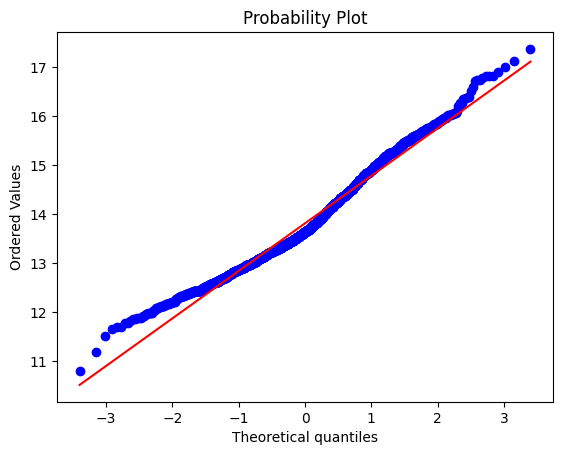

In [20]:
fig = plt.figure()
res = stats.probplot(data['Price'], plot=plt)
plt.show()

In [21]:
data_numeric = data.select_dtypes([int,float])
data_numeric

,Price,Year,Kilometer,Engine,Length,Width,Height,Seating Capacity,Max Power Bph,Max Power rpm,Max Torque Nm,Max Torque rpm,Fuel Tank Capacity
0,13.132316,2017,87150,1198,3990.0,1680.0,1505.0,5.0,87.0,6000,109.0000,4500,35.0
1,13.017005,2014,75000,1248,3995.0,1695.0,1555.0,5.0,74.0,4000,190.0000,2000,42.0
2,12.301387,2011,67000,1197,3585.0,1595.0,1550.0,5.0,79.0,6000,112.7619,4000,35.0
3,13.591117,2019,37500,1197,3995.0,1745.0,1510.0,5.0,82.0,6000,113.0000,4200,37.0
4,14.483340,2018,69000,2393,4735.0,1830.0,1795.0,7.0,148.0,3400,343.0000,1400,55.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2054,13.652993,2016,90300,2179,4585.0,1890.0,1785.0,7.0,138.0,3750,330.0000,1600,70.0
2055,12.524530,2014,83000,814,3495.0,1550.0,1500.0,5.0,55.0,5500,75.0000,4000,32.0
2056,12.388398,2013,73000,1196,3795.0,1680.0,1427.0,5.0,70.0,6250,102.0000,4000,45.0
2057,15.271798,2018,60474,1995,4936.0,1868.0,1479.0,5.0,188.0,4000,400.0000,1750,65.0


In [22]:
Q1 = data_numeric.quantile(0.25)
Q3 = data_numeric.quantile(0.75)

IQR = Q3 - Q1

outlier_mask = (data_numeric < (Q1 - 1.5 * IQR)) | (data_numeric > (Q3 + 1.5 * IQR))

data = data[~outlier_mask.any(axis=1)]

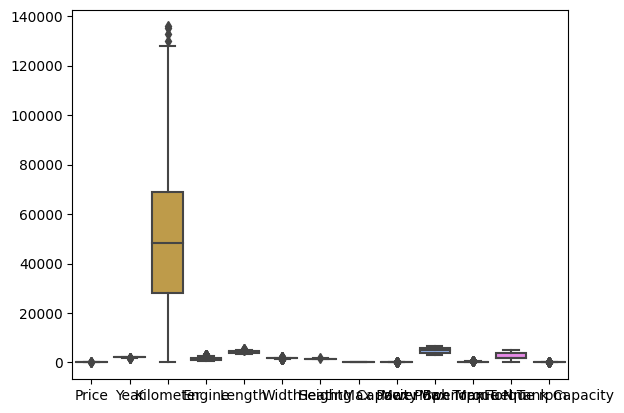

In [23]:
sns.boxplot(data=data)
plt.show()

In [24]:
from sklearn.preprocessing import LabelEncoder

columns_to_encode = data.select_dtypes(object)

le = LabelEncoder()
for col in columns_to_encode:
    encoded_data = le.fit_transform(data[col])
    data[col + '_encoded'] = encoded_data

data = data.drop(columns=columns_to_encode)

In [25]:
data.head()

,Price,Year,Kilometer,Engine,Length,Width,Height,Seating Capacity,Max Power Bph,Max Power rpm,...,Fuel Tank Capacity,Make_encoded,Model_encoded,Fuel Type_encoded,Transmission_encoded,Location_encoded,Color_encoded,Owner_encoded,Seller Type_encoded,Drivetrain_encoded
0,13.132316,2017,87150,1198,3990.0,1680.0,1505.0,5.0,87.0,6000,...,35.0,6,60,4,1,52,7,1,1,1
1,13.017005,2014,75000,1248,3995.0,1695.0,1555.0,5.0,74.0,4000,...,42.0,16,535,1,1,37,15,3,2,1
2,12.301387,2011,67000,1197,3585.0,1595.0,1550.0,5.0,79.0,6000,...,35.0,7,688,4,1,36,8,1,2,1
3,13.591117,2019,37500,1197,3995.0,1745.0,1510.0,5.0,82.0,6000,...,37.0,24,349,4,1,38,13,1,2,1
5,13.422469,2017,73315,1373,4490.0,1730.0,1485.0,5.0,91.0,6000,...,43.0,16,150,4,1,52,7,1,2,1


In [26]:
data = data.fillna(0)

In [27]:
data.isnull().sum()

Price                   0
Year                    0
Kilometer               0
Engine                  0
Length                  0
Width                   0
Height                  0
Seating Capacity        0
Max Power Bph           0
Max Power rpm           0
Max Torque Nm           0
Max Torque rpm          0
Fuel Tank Capacity      0
Make_encoded            0
Model_encoded           0
Fuel Type_encoded       0
Transmission_encoded    0
Location_encoded        0
Color_encoded           0
Owner_encoded           0
Seller Type_encoded     0
Drivetrain_encoded      0
dtype: int64

In [28]:
X = data.drop(columns=['Price','Model_encoded'])
y = data['Price']

In [29]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=111)

## Modeling

In [30]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [32]:
from sklearn.ensemble import RandomForestRegressor
import xgboost
from sklearn.ensemble import ExtraTreesRegressor

regressor = RandomForestRegressor(
    bootstrap=True,
    max_features=0.7500000000000001,
    min_samples_leaf=1,
    min_samples_split=9,
    n_estimators=100,
    random_state=111  # You may want to set the random_state for reproducibility
)

regressor.fit(X_train, y_train)
predictions = regressor.predict(X_test)

This research employs Random Forest Regressor, a type of machine learning model that uses multiple decision trees to make predictions. The settings control how the model is built and operates. For instance, it uses 100 trees (n_estimators=100), considers 75% of available features for each decision (max_features=0.75), and ensures consistent results in every run (random_state=111).

## Result

In [33]:
from sklearn import metrics

# R2 (R Square)
print('R squared: {}'.format(metrics.r2_score(y_test, predictions)))
# MAE (Mean Absolute Error)
print('MAE: {}'.format(metrics.mean_absolute_error(y_test, predictions)))
# MAPE (Mean Absolute Percentage Error)
non_zero_indices = y_test != 0
mape_value = np.mean(np.abs((y_test[non_zero_indices] - predictions[non_zero_indices]) / y_test[non_zero_indices])) * 100
print('MAPE: {}'.format(mape_value))
# RMSE(Root Mean Squared Error)
print('RMSE: {}'.format(metrics.mean_squared_error(y_test, predictions)**0.5))

R squared: 0.9523813382411676
MAE: 0.14248497250010483
MAPE: 1.0456638735432326
RMSE: 0.18819917203713524


In [34]:
train_score = regressor.score(X_train, y_train)
test_score = regressor.score(X_test, y_test)

print(f"Training Score: {train_score}")
print(f"Testing Score: {test_score}")

Training Score: 0.9847678389469922
Testing Score: 0.9523813382411676


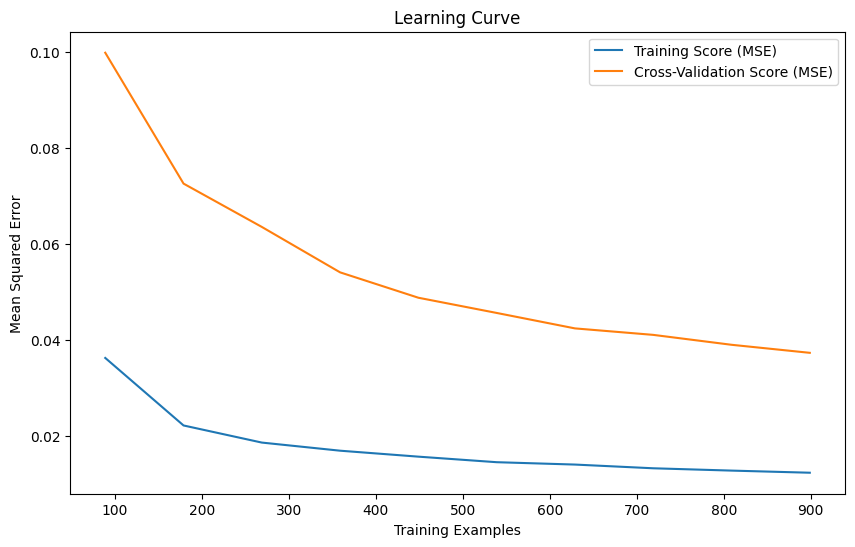

In [35]:
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(
    regressor, X_train, y_train, cv=5, scoring='neg_mean_squared_error', train_sizes=np.linspace(0.1, 1.0, 10)
)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, -np.mean(train_scores, axis=1), label='Training Score (MSE)')
plt.plot(train_sizes, -np.mean(test_scores, axis=1), label='Cross-Validation Score (MSE)')
plt.title('Learning Curve')
plt.xlabel('Training Examples')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.show()

Based on the provided evaluation metrics, Random Forest Regressor model appears to perform well. The R-squared value of approximately 0.95 indicates that the model explains about 95% of the variability in the target variable. The MAE and MAPE values are relatively low, suggesting that the model’s predictions are close to the actual values. The RMSE value is also reasonably low, indicating a satisfactory error rate.

in the graph, we can see that both the training and test scores decrease steadily as the number of training samples increases. This indicates that the machine learning model is not overfitting the training data and can still generalize well to test data.

In addition, the training and test scores are also within the same range. This suggests that the machine learning model is not biased towards the training data and can still provide accurate predictions on test data.